# APS1070 Week 8 Lecture Code

## Application 1 - Background Removal

This example shows how singular value decomposition can be used to remove a background from a video and identify moving objects, in this case people in the video ([source](https://nbviewer.jupyter.org/github/fastai/numerical-linear-algebra/blob/master/nbs/3.%20Background%20Removal%20with%20Robust%20PCA.ipynb)).

In [2]:
!wget "https://saref.github.io/teaching/APS1070/test.mp4"

--2024-11-05 19:14:14--  https://saref.github.io/teaching/APS1070/test.mp4
Resolving saref.github.io (saref.github.io)... 185.199.108.153, 185.199.109.153, 185.199.110.153, ...
Connecting to saref.github.io (saref.github.io)|185.199.108.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5248590 (5.0M) [video/mp4]
Saving to: ‘test.mp4.1’

test.mp4.1          100%[===================>]   5.00M  --.-KB/s    in 0.1s    

2024-11-05 19:14:14 (39.8 MB/s) - ‘test.mp4.1’ saved [5248590/5248590]



In [3]:
# import required libraries
!pip3 install imageio==2.4.1
import numpy as np
import scipy
import matplotlib.pyplot as plt

import imageio
import moviepy.editor as mpe
from skimage.transform import resize

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 30.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for imageio: filename=imageio-2.4.1-py3-none-any.whl size=3303884 sha256=27bfafc41fc227520079a443dc7598c11d3f7edba6848189064023a241022a69
  Stored in directory: /root/.cache/pip/wheels/96/5d/ce/bdbdb04744dac03906336eb0d01ff1e222061d3419c55c55f9
Successfully built imageio
  Attempting uninstall: imageio
    Found existing installation: imageio 2.36.0
    Uninstalling imageio-2.36.0:
      Successfully uninstalled imageio-2.36.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
moviepy 1.0.3 requires imageio<3.0,>=2.5; python_version >= "3.4", but you have imageio 2.4.1 which is incompatible.
scikit-image 0.24.0 requires imageio>=2.33, but you have imageio 2.4.1 which is incompatible.


  if event.key is 'enter':



In [4]:
# load the video from the session storage
video = mpe.VideoFileClip("test.mp4") # file needs to be loaded

In [5]:
# clip video to 20 seconds and display
video = video.subclip(0,20)
video.ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [6]:
# display video details (duration, resolution, fps)
video.duration, video.size, video.fps

(20, (1280, 720), 23.976023976023978)

Helper Functions

In [7]:
# convert video to data matrix
def create_data_matrix_from_video(clip, k, scale):
    frames = []
    for i in range(k * int(clip.duration)):
        frame = clip.get_frame(i / float(k))
        frame = rgb2grey(frame).astype(int)
        #frame = resize(frame, (72,128)).flatten()
        frame = resize(frame, (frame.shape[0]/scale,frame.shape[1]/scale)).flatten()
        frames.append(frame)
    return np.vstack(frames).T # stack images horizontally

# covert colour frames to greyscale
def rgb2grey(rgb):
    return np.dot(rgb[..., :3], [0.299, 0.587, 0.114])

def plot_images(M, A, E, index_array, dims, filename=None):
    f = plt.figure(figsize=(15, 10))
    r = len(index_array)
    pics = r * 3
    for k, i in enumerate(index_array):
        for j, mat in enumerate([M, A, E]):
            sp = f.add_subplot(r, 3, 3*k + j + 1)
            sp.axis('Off')
            if isinstance(pixels, scipy.sparse.csr_matrix):
                pixels = pixels.todense()
            plt.imshow(np.reshape(pixels, dims), cmap='gray')
    return f

Video Matrix - convert video to data matrix

In [8]:
# change resolution of image (dividing by 4)
scale = 4 # scaling factor (1 means no scaling) CHANGE THIS FOR BETTER RESOLUTION
original_width = video.size[1]
original_height = video.size[0]

dims = (int(original_width / scale), int(original_height / scale))
dims # single frame dimensions (height x width)

(180, 320)

There will be 180x320=57600 pixels in each frame. Pixels are features and frames are samples.

In [9]:
fps = 20 #set frames per second
M = create_data_matrix_from_video(video, fps, scale)
np.save('video_matrix', M)
M.shape

(57600, 400)

An image from 1 moment in time is 180 pixels by 320 pixels (when scaled by 4 times). We can *unroll* that picture into a single tall column.

This isn't human-readable, but it's handy because it lets us put the images from different moments side by side, to put the whole video into one matrix.  If we took the video image every 20th of a second for 20 seconds (so 400 different images, each from a different point in time), we'd have a $57600 \times 400$ matrix, representing the video!

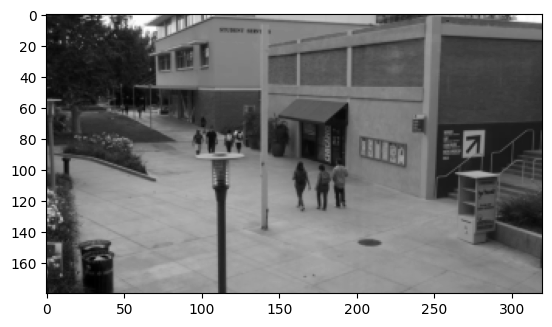

In [10]:
#!pip install Pillow==9.0.0
plt.imshow(np.reshape(M[:,100], dims), cmap='gray'); #100th sample frame

This is what our tall and skinny matrix ***M*** looks like.

> Note that this matrix is constructed such that features are rows and samples are columns.



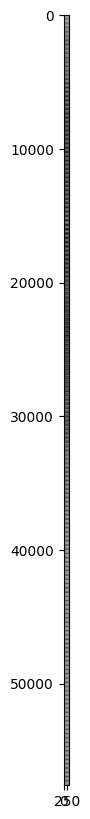

In [11]:
plt.figure(figsize=(1, 10))
plt.imshow(M, cmap='gray')

### SVD

In [12]:
# We use SVD from numpy and set full_matrices as False to save some time by
# not computing the whole U matrix (economic SVD)
U, s, V = np.linalg.svd(M, full_matrices=False)

In [13]:
U.shape, s.shape, V.shape

((57600, 400), (400,), (400, 400))

In [14]:
# We can save these matrices to the session storage
np.save("U.npy", U)
np.save("s.npy", s)
np.save("V.npy", V)

In [15]:
# And later load them from the session storage
U = np.load("U.npy")
s = np.load("s.npy")
V = np.load("V.npy")

We have 400 singular values.   
The first vector of U, V and first singular value represent the dimension with the maximum explaination of our data. Guess what? Maximum similarity across frames is going to be defined by the background pixels.

We choose first 5 singular values and first 5 vectors of U and V. These vectors explain maximum explanation of the data (in which background pixels will be predominant). We use these vectors to reconstruct the low rank matrix of same shape as the original matrix. If we use this reconstructed matrix to make the video. That video will only include background. Now we can get remaining foreground by just subtracting the low rank matrix from original matrix M.

Choice of how many singular values to use depends on the quality of video.

In [23]:
# The first 5 singular values
s[0:5]

array([6.24355130e-14, 1.88801346e-15, 1.38263130e-15, 1.09823090e-15,
       9.35162270e-16])

In [24]:
# Low rank matrix constructed using the first five singular values
low_rank = (U[:,0:5] * s[0:5])@V[0:5,:]

In [25]:
# It has the same shape
low_rank.shape

(57600, 400)

Display only the background of a sample frame

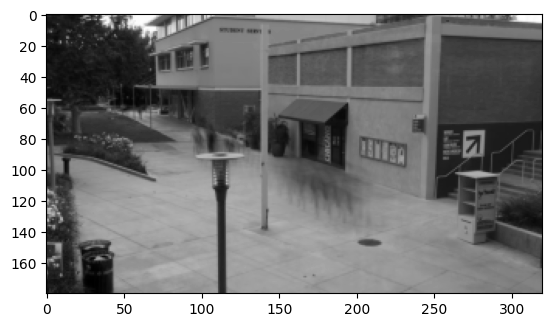

In [26]:
# Frame 100 of the low rank matrix
plt.imshow(np.reshape(low_rank[:,100], dims), cmap='gray');

As we can observe that person is now lost from our sample frame. If we subtract this low rank matrix from M matrix, we will get only foreground. i.e. person walking

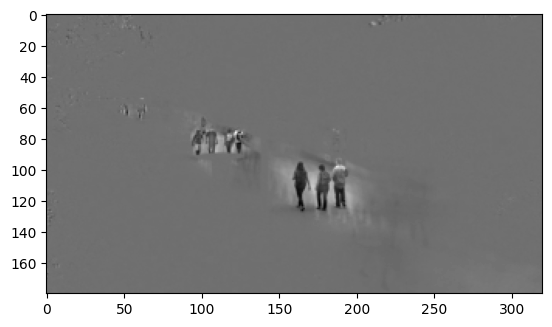

In [27]:
# Subtraction
plt.imshow(np.reshape(M[:,100] - low_rank[:,100], dims), cmap='gray');

### Video
Create a video by subtracting background from each frame in the movie

In [28]:
from moviepy.video.io.bindings import mplfig_to_npimage

In [29]:
def make_video(matrix, dims, filename):
    mat_reshaped = np.reshape(matrix, (dims[0], dims[1], -1))

    fig, ax = plt.subplots()
    def make_frame(t):
        ax.clear()
        ax.imshow(mat_reshaped[...,int(t*fps)])
        return mplfig_to_npimage(fig)

    animation = mpe.VideoClip(make_frame, duration=int(10)) #duration set to 10 seconds
    animation.write_videofile( filename + '.mp4', fps=fps)

Moviepy - Building video ped.mp4.
Moviepy - Writing video ped.mp4



Moviepy - Done !
Moviepy - video ready ped.mp4


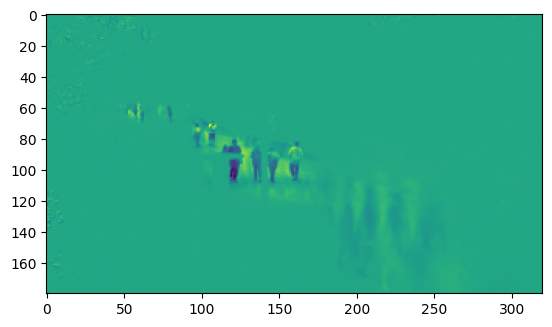

In [30]:
# creating a video of pedestrians only
make_video(M - low_rank, dims, "ped")

In [31]:
# saving the video
mpe.VideoFileClip("ped.mp4").subclip().ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


This is only one of many approaches that can be used to remove background from videos.

## Application 2 - Movie Recommendations

In our next example we will apply SVDs for making movie recommendations. ([source](https://analyticsindiamag.com/singular-value-decomposition-svd-application-recommender-system/)). There are many approaches for making movie recommendations. Here we will use the approach where given a movie title, we will use SVD to recommend similar movies based on a matrix of user ratings.

#### Toy Data
To start let us look at a toy example from the MML textbook Example 4.14) to get a sense of what SVD is doing.

Four rows/movies (Star Wars, Blade Runner, Amelie, Delicatessen) with ratings in three columns/reviewers.

In [32]:
# importing required libraries
import numpy as np

In [33]:
# toy movie matrix from the textbook
ratings = [[5, 4, 1],
           [5, 5, 0],
           [0, 0, 5],
           [1, 0, 4]]

ratings = np.array(ratings)
ratings

array([[5, 4, 1],
       [5, 5, 0],
       [0, 0, 5],
       [1, 0, 4]])

obtain SVD from toy ratings matrix

In [34]:
U, S, V = np.linalg.svd(ratings)

In [35]:
U, S, V

(array([[-0.67096878,  0.02362898, -0.46466034, -0.57735027],
        [-0.7197425 ,  0.20541998,  0.47585716,  0.46188022],
        [-0.09389374, -0.77048084,  0.52682373, -0.34641016],
        [-0.15151103, -0.6029955 , -0.52925183,  0.57735027]]),
 array([9.6438109 , 6.36389089, 0.70555232]),
 array([[-0.73674894, -0.65146317, -0.1810987 ],
        [ 0.0852072 ,  0.17624687, -0.9806512 ],
        [-0.67077622,  0.73792464,  0.07434034]]))

reconstruction using first singular value

In [36]:
# reconstruction using first singular value
u1 = U[:,0:1]
v1 = V[0:1,:]
A1 = (u1*S[0])@v1
A1

array([[4.76727846, 4.21542018, 1.17183466],
       [5.11381898, 4.52184531, 1.25701705],
       [0.66712138, 0.58989567, 0.1639837 ],
       [1.0764961 , 0.95188134, 0.26461123]])

reconstruction using second singular value

In [37]:
u2 = U[:,1:2]
v2 = V[1:2,:]
A2 = S[1]*u2@v2
A2

array([[ 0.0128128 ,  0.02650264, -0.14746276],
       [ 0.11138885,  0.23040231, -1.28197623],
       [-0.41779272, -0.86418352,  4.80838387],
       [-0.32697391, -0.67632931,  3.76314855]])

Reconstruction using third singular value will not be helpful because the third singular value has a much smaller magnitude that the the first and second singular values.

By examining A1, we can see that A1 captures the intersection of "sci-fi-ness" (sci-fi movies and fans). Similarly A2 captures the intersection of "French-ness" (French movie theme and user fans).

Let us examine what happens if we combine A1 and A2 and how it compares to the original ratings.

In [38]:
A1+A2

array([[ 4.78009126,  4.24192282,  1.0243719 ],
       [ 5.22520783,  4.75224761, -0.02495918],
       [ 0.24932866, -0.27428785,  4.97236757],
       [ 0.7495222 ,  0.27555202,  4.02775979]])

In [39]:
ratings

array([[5, 4, 1],
       [5, 5, 0],
       [0, 0, 5],
       [1, 0, 4]])

In [40]:
np.round(A1+A2)

array([[ 5.,  4.,  1.],
       [ 5.,  5., -0.],
       [ 0., -0.,  5.],
       [ 1.,  0.,  4.]])

Adding A1 and A2 seems to provide a reasonable estimate for A. This is expected because the first and second singular values had substantially larger magnitude than the third singular value.


We can also reconstruct A by multiplying U, S and V to verify
the correctness of this SVD operation

In [41]:
# construct diagonal singular matrix
n = len(S)
S_diag = np.zeros((4, 3))
S_diag[:n,:n] = np.diag(S)
S_diag

array([[9.6438109 , 0.        , 0.        ],
       [0.        , 6.36389089, 0.        ],
       [0.        , 0.        , 0.70555232],
       [0.        , 0.        , 0.        ]])

In [44]:
# reconstruct original ratings matrix
A = U@S_diag@V
A
# np.round(A)

array([[ 5.00000000e+00,  4.00000000e+00,  1.00000000e+00],
       [ 5.00000000e+00,  5.00000000e+00, -1.06240243e-16],
       [ 1.40094438e-16,  1.95332807e-16,  5.00000000e+00],
       [ 1.00000000e+00,  1.22751951e-16,  4.00000000e+00]])

The above toy dataset shows how we can manipulate the results from SVD to reconstruct something with the shape of the rectangular data matrix where the similarity patterns are more visible.

#### Large Movie Dataset
Let us now apply SVD to a reasonably large data set of movie ratings to see if we can obtain some recommendations.

In [45]:
!wget "https://saref.github.io/teaching/APS1070/ratings.dat"
!wget "https://saref.github.io/teaching/APS1070/movies.dat"

--2024-11-05 19:58:15--  https://saref.github.io/teaching/APS1070/ratings.dat
Resolving saref.github.io (saref.github.io)... 185.199.109.153, 185.199.108.153, 185.199.111.153, ...
Connecting to saref.github.io (saref.github.io)|185.199.109.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 24594131 (23M) [application/octet-stream]
Saving to: ‘ratings.dat’

ratings.dat         100%[===================>]  23.45M   135MB/s    in 0.2s    

2024-11-05 19:58:16 (135 MB/s) - ‘ratings.dat’ saved [24594131/24594131]

--2024-11-05 19:58:16--  https://saref.github.io/teaching/APS1070/movies.dat
Resolving saref.github.io (saref.github.io)... 185.199.109.153, 185.199.108.153, 185.199.111.153, ...
Connecting to saref.github.io (saref.github.io)|185.199.109.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 171308 (167K) [application/octet-stream]
Saving to: ‘movies.dat’

movies.dat          100%[===================>] 167.29K  --.-KB/s    in 0.04s

In [46]:
# load common libraries
import numpy as np
import pandas as pd

In [47]:
# load movie data
data = pd.io.parsers.read_csv('ratings.dat',
    names=['user_id', 'movie_id', 'rating', 'time'],
    engine='python', delimiter='::')

movie_data = pd.io.parsers.read_csv('movies.dat',
    names=['movie_id', 'title', 'genre'],encoding='latin-1',
    engine='python', delimiter='::')

In [48]:
# determine number of movies and users
num_movies = np.max(data.movie_id.values)
num_users = np.max(data.user_id.values)

# initialize a rating matrix
ratings_mat = np.zeros((num_movies, num_users))

# display dimensions
print('Num Movies: ', num_movies)
print('Num Users: ', num_users)
print('Ratings Matrix: ', ratings_mat.shape)

Num Movies:  3952
Num Users:  6040
Ratings Matrix:  (3952, 6040)


In [49]:
# movies and user start at 1, adjust to start at 0
ratings_mat[data.movie_id.values-1, data.user_id.values-1] = data.rating.values

In [50]:
# flip dimensions so that A becomes a tall matrix of users(rows) x movies(columns)
A = ratings_mat.T

# apply full svd
# This takes a minute
U, S, V = np.linalg.svd(A)
U.shape, S.shape, V.shape

((6040, 6040), (3952,), (3952, 3952))

Helper Functions

In [ ]:
# use cosine similarity to find indices of similar movies
def top_cosine_similarity(data, movie_id, top_n=10):
    index = movie_id - 1 # Movie id starts from 1 in the dataset
    movie_row = data[index, :]
    magnitude = np.sqrt(np.einsum('ij, ij -> i', data, data))
    similarity = np.dot(movie_row, data.T) / (magnitude[index] * magnitude)
    sort_indices = np.argsort(-similarity)
    return sort_indices[:top_n]

# find movies by indices
def print_similar_movies(movie_data, movie_id, top_indices):
    print('Recommendations for {0}: \n'.format(
    movie_data[movie_data.movie_id == movie_id].title.values[0]))
    for id in top_indices + 1:
        print(movie_data[movie_data.movie_id == id].title.values[0])

In [ ]:
# obtain a list of movies by representing them using k components
k = 50
movie_id = 1207 # (getting an id from movies.dat)
top_n = 10
sliced = V.T[:, :k] # representative data

# list movies
indices = top_cosine_similarity(sliced, movie_id, top_n)
print_similar_movies(movie_data, movie_id, indices)

# sample movie indices based on movies.dat file
# 10 - GoldenEye,
# 1200 - Aliens,
# 1214 - Alien,
# 1196 - Star Wars Episode V,
# 1207 - To Kill a Mockingbird

  similarity = np.dot(movie_row, data.T) / (magnitude[index] * magnitude)



Recommendations for To Kill a Mockingbird (1962): 

To Kill a Mockingbird (1962)
Grapes of Wrath, The (1940)
Inherit the Wind (1960)
In the Heat of the Night (1967)
Streetcar Named Desire, A (1951)
Midnight Cowboy (1969)
On the Waterfront (1954)
Raisin in the Sun, A (1961)
Graduate, The (1967)
Man for All Seasons, A (1966)


Normally we would not apply SVD unless we had accurate information for all the ratings. By providing a zero rating, we are in a sense creating poor ratings for a large number of movies. Even so, SVD seems to do reasonably well.

We will revisit this problem when we talk about optimization (requires vector calculus) to show how we can better approximate the ratings.

## Application 3 - Topic Extraction

In this example we will look into how SVD can be used to identify representative topics from a large data set of news articles ([source](https://nbviewer.jupyter.org/github/fastai/numerical-linear-algebra/blob/master/nbs/2.%20Topic%20Modeling%20with%20NMF%20and%20SVD.ipynb)).

In [ ]:
# import common libraries
import numpy as np
from sklearn.datasets import fetch_20newsgroups
from sklearn import decomposition
from scipy import linalg
import matplotlib.pyplot as plt

In [ ]:
# load news groups from sklearn builtin datasets
categories = ['alt.atheism', 'comp.graphics', 'sci.space', 'talk.religion.misc']
remove = ('headers', 'footers', 'quotes')
newsgroups_train = fetch_20newsgroups(subset='train', categories=categories, remove=remove)

In [ ]:
# Shape of the dataset
newsgroups_train.filenames.shape, newsgroups_train.target.shape

((2034,), (2034,))

In [ ]:
newsgroups_train.filenames[:3]

array(['/root/scikit_learn_data/20news_home/20news-bydate-train/comp.graphics/38816',
       '/root/scikit_learn_data/20news_home/20news-bydate-train/talk.religion.misc/83741',
       '/root/scikit_learn_data/20news_home/20news-bydate-train/sci.space/61092'],
      dtype='<U86')

In [ ]:
#newsgroups_train.target_names

In [ ]:
# Labels for the first three articles of the dataset
#newsgroups_train.target[:3]

# confirming the first three labels from target names
np.array(newsgroups_train.target_names)[newsgroups_train.target[:3]]

array(['comp.graphics', 'talk.religion.misc', 'sci.space'], dtype='<U18')

In [ ]:
# topic from computer graphics
print('\n'.join(newsgroups_train.data[0:1]))

Hi,

I've noticed that if you only save a model (with all your mapping planes
positioned carefully) to a .3DS file that when you reload it after restarting
3DS, they are given a default position and orientation.  But if you save
to a .PRJ file their positions/orientation are preserved.  Does anyone
know why this information is not stored in the .3DS file?  Nothing is
explicitly said in the manual about saving texture rules in the .PRJ file. 
I'd like to be able to read the texture rule information, does anyone have 
the format for the .PRJ file?

Is the .CEL file format available from somewhere?

Rych


In [ ]:
# topic from religion
print('\n'.join(newsgroups_train.data[1:2]))



Seems to be, barring evidence to the contrary, that Koresh was simply
another deranged fanatic who thought it neccessary to take a whole bunch of
folks with him, children and all, to satisfy his delusional mania. Jim
Jones, circa 1993.


Nope - fruitcakes like Koresh have been demonstrating such evil corruption
for centuries.


In [ ]:
# topic about science and space
print('\n'.join(newsgroups_train.data[2:3]))


 >In article <1993Apr19.020359.26996@sq.sq.com>, msb@sq.sq.com (Mark Brader) 

MB>                                                             So the
MB> 1970 figure seems unlikely to actually be anything but a perijove.

JG>Sorry, _perijoves_...I'm not used to talking this language.

Couldn't we just say periapsis or apoapsis?

 


Next, scikit learn has a method that will extract all the word counts for us.

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [ ]:
vectorizer = CountVectorizer(stop_words='english')
vectors = vectorizer.fit_transform(newsgroups_train.data).todense() # (documents, vocab)
vectors.shape #, vectors.nnz / vectors.shape[0], row_means.shape

(2034, 26576)

`columns` represent unique words  
`rows` represent documents   
`cell` i,j represents the occurence of word j in document i  

In [ ]:
# get all unique words from corpus of docs
vocab = np.array(vectorizer.get_feature_names_out())

In [ ]:
vocab.shape

(26576,)

In [ ]:
# Looking at some of the vocabulary
vocab[7000:7020]

array(['cosmonauts', 'cosmos', 'cosponsored', 'cost', 'costa', 'costar',
       'costing', 'costly', 'costruction', 'costs', 'cosy', 'cote',
       'couched', 'couldn', 'council', 'councils', 'counsel',
       'counselees', 'counselor', 'count'], dtype=object)

SVD applied on the [documents x words] matrix

In [ ]:
# We set full_matrices to False to save time by computing VT only partially
U, s, Vh = linalg.svd(vectors, full_matrices=False)

In [ ]:
# We have 2034 singular values and they (their first few) represent the topics
print(U.shape, s.shape, Vh.shape)

(2034, 2034) (2034,) (2034, 26576)


`s` are singular values in decreasing order

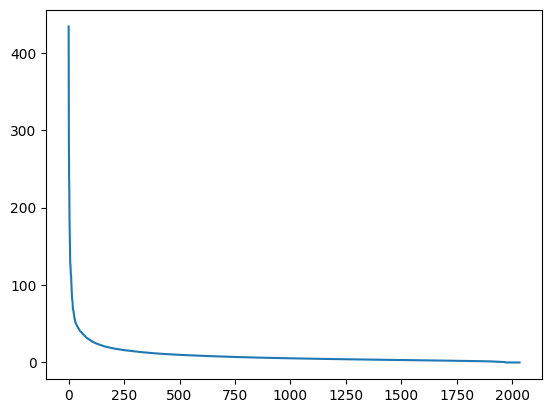

In [ ]:
# Scree plot
plt.plot(s);

Exploring Topics

In [ ]:
# Let's look at 8 most frequent words from each topic

num_top_words=8

def show_topics(a):
    top_words = lambda t: [vocab[i] for i in np.argsort(t)[:-num_top_words-1:-1]]
    topic_words = ([top_words(t) for t in a])
    return [' '.join(t) for t in topic_words]

In [ ]:
# Let's take a look at the first ten singular values and what topics they represent

show_topics(Vh[:10])

['ditto critus propagandist surname galacticentric kindergarten surreal imaginative',
 'jpeg gif file color quality image jfif format',
 'graphics edu pub mail 128 3d ray ftp',
 'jesus god matthew people atheists atheism does graphics',
 'image data processing analysis software available tools display',
 'god atheists atheism religious believe religion argument true',
 'space nasa lunar mars probe moon missions probes',
 'image probe surface lunar mars probes moon orbit',
 'argument fallacy conclusion example true ad argumentum premises',
 'space larson image theory universe physical nasa material']

We can see that topics are telling something. For example,   

`Topic 1` is related to `image quality` etc.  
`Topic 2` is related to `computer graphics`.  
`Topic 3` is related to `religion/atheism`.  
Last topic, `topic 9`, is related to `space`.
